In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/coco-2017-dataset/coco2017/val2017/000000011197.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000219485.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000151000.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000371677.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000038825.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000384527.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000122969.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000028809.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000053505.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000384513.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000356531.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000106563.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000125257.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000259571.jpg
/kaggle/input/coco-2017-dataset/coco2017/val2017/000000568690.jpg
/kaggle/in

In [2]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

In [3]:
# Load COCO dataset

dataDir = '/kaggle/input/coco-2017-dataset/coco2017'
dataType = 'train2017'
annFile = os.path.join(dataDir, 'annotations', f'instances_{dataType}.json')

In [4]:
# Load COCO annotations
coco = COCO(annFile)
img_ids = coco.getImgIds()
print("Total images in dataset:", len(img_ids))

loading annotations into memory...
Done (t=23.80s)
creating index...
index created!
Total images in dataset: 118287


In [5]:
# Select 20,000 images and 5,000 for masking
selected_img_ids = random.sample(img_ids, 20000)
masked_ids = random.sample(selected_img_ids, 5000)

In [6]:
def visualize_strong_mask(coco, img_id):
    """
    Draws vivid COCO-style colored segmentation masks on the main subject(s)
   .
    """
    # Load image info
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(dataDir, dataType, img_info['file_name'])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    # Create an overlay for colored masks
    overlay = img.copy()

    for ann in anns:
        mask = coco.annToMask(ann)

        # Generate a vivid random color for each object
        color = np.random.randint(0, 255, (3,), dtype=np.uint8)
        overlay[mask == 1] = color  # Strong solid color fill

        # Optionally, draw object boundaries for better visibility
        contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(overlay, contours, -1, (0, 0, 0), 1)  # thin black boundary

    # Blend masks slightly (for soft but vivid overlay)
    final_output = cv2.addWeighted(img, 0.6, overlay, 0.7, 0)

    return img, final_output

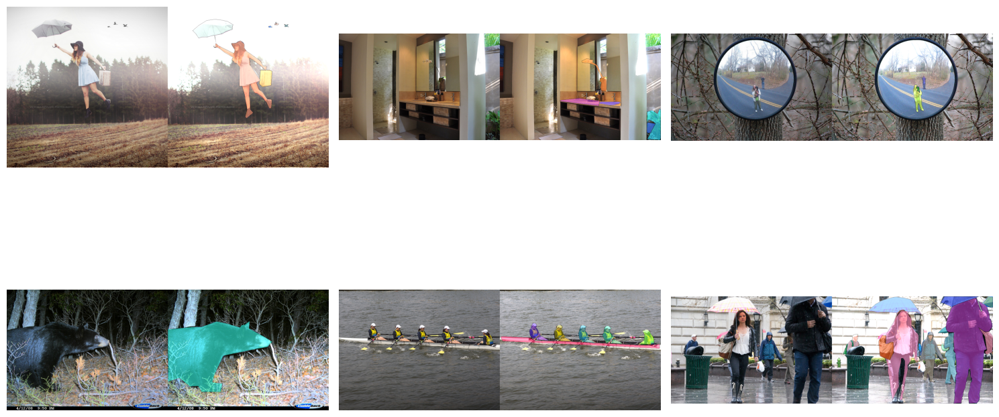

In [7]:
plt.figure(figsize=(15, 10))

for i, img_id in enumerate(masked_ids[:6]):
    original, masked = visualize_strong_mask(coco, img_id)
    combined = np.hstack((original, masked))
    plt.subplot(2, 3, i + 1)
    plt.imshow(combined)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [8]:
!kaggle kernels pull !kaggle kernels pull username/notebook-name -p /kaggle/working/-p /kaggle/working/


Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 4, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.11/dist-packages/kaggle/__init__.py", line 6, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 434, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.config/kaggle. Or use the environment method. See setup instructions at https://github.com/Kaggle/kaggle-api/
